## TIME SERIES ANALYSIS
## Goal: Find outliers, trends and periodicity in the MTA turnstile data

### Download data and see what's inside it

In [19]:
import numpy as np
import pandas as pd
import os
import matplotlib.pylab as plt
%matplotlib inline

In [3]:
!curl -O "http://cosmo.nyu.edu/~fb55/UI_CUSP_2015/data/MTA_Fare.npy"
data=np.load("MTA_Fare.npy")
data

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 10.2M  100 10.2M    0     0   182k      0  0:00:57  0:00:57 --:--:--  142k


In [21]:
data.shape # a cube

(600, 23, 194)

### The missing vaules are inputted as "-1", they can be replaced by "nan"

In [6]:
#http://stackoverflow.com/questions/27778299/replace-zeros-in-a-numpy-array-with-nan
df = data.astype('float')
df[df == -1] = np.nan
df

array([[[  5.69610000e+04,   6.47030000e+04,   6.80020000e+04, ...,
           3.65270000e+04,   3.39290000e+04,   3.68240000e+04],
        [  1.73200000e+03,   2.08300000e+03,   2.10700000e+03, ...,
           1.26400000e+03,   1.17200000e+03,   1.23800000e+03],
        [  2.03000000e+02,   2.76000000e+02,   2.45000000e+02, ...,
           1.86000000e+02,   1.67000000e+02,   1.67000000e+02],
        ..., 
        [  0.00000000e+00,   0.00000000e+00,   0.00000000e+00, ...,
           0.00000000e+00,   0.00000000e+00,   0.00000000e+00],
        [  0.00000000e+00,   0.00000000e+00,   0.00000000e+00, ...,
           0.00000000e+00,   0.00000000e+00,   0.00000000e+00],
        [             nan,              nan,              nan, ...,
           1.12100000e+03,   1.37700000e+03,   7.12000000e+02]],

       [[  1.62100000e+04,   2.01790000e+04,   2.17690000e+04, ...,
                      nan,              nan,              nan],
        [  5.03000000e+02,   6.47000000e+02,   6.65000000e+0

In [10]:
df.shape

(600, 23, 194)

# 1
### Event detection: Identify the most prominent event. There is a very significant drop (>3-sigma) in all time series. Identify it, figure out the date (you know when the data starts and what the cadence is) and figure out what it is due to. 

In [29]:
#flatten the first two dimensions of the cube data
df0 = pd.DataFrame(df.reshape(-1, 194))
df0.shape

(13800, 194)

In [30]:
#sum_all is the usage sum of all 600 stations and all 23 ridetype in 194 weeks
sum_all = np.nansum(df0, axis=0)
sum_all.size

194

In [44]:
#create a datetime index by pd.date_range
labels = pd.date_range('05/28/2010', '02/14/2014', freq= 'w')
labels

DatetimeIndex(['2010-05-30', '2010-06-06', '2010-06-13', '2010-06-20',
               '2010-06-27', '2010-07-04', '2010-07-11', '2010-07-18',
               '2010-07-25', '2010-08-01',
               ...
               '2013-12-08', '2013-12-15', '2013-12-22', '2013-12-29',
               '2014-01-05', '2014-01-12', '2014-01-19', '2014-01-26',
               '2014-02-02', '2014-02-09'],
              dtype='datetime64[ns]', length=194, freq='W-SUN')

In [72]:
#merge data into a data frame
df1 = pd.DataFrame({"week":labels ,"count": sum_all})
df1.head()

,count,week
0,26720267.0,2010-05-30
1,29265971.0,2010-06-06
2,29601189.0,2010-06-13
3,29387592.0,2010-06-20
4,29185768.0,2010-06-27


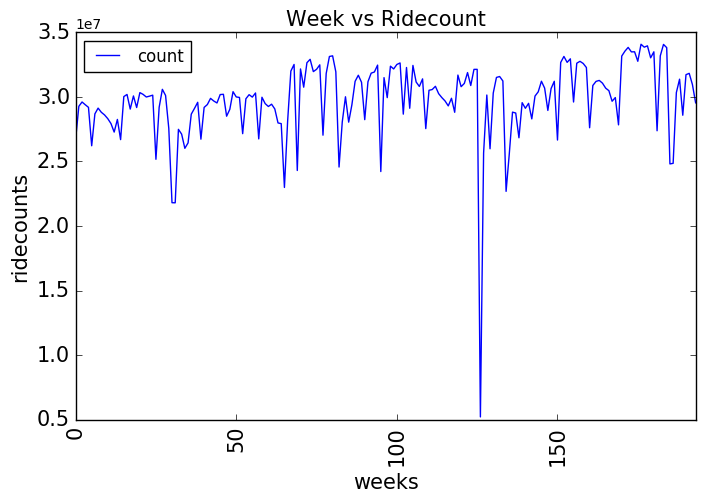

In [100]:
ax = df1.plot(figsize=(8,5))

plt.xticks(rotation=90, fontsize=15)
plt.yticks(fontsize=15)
plt.ylabel('ridecounts',fontsize=15)
plt.xlabel('weeks',fontsize=15)
plt.title('Week vs Ridecount',fontsize=15)

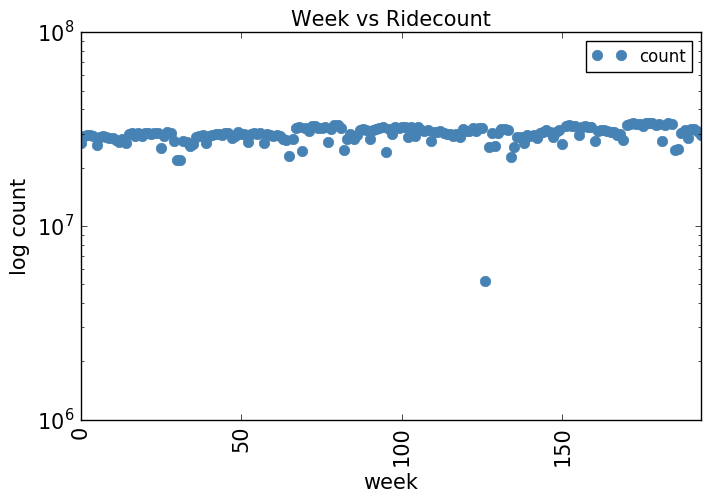

In [149]:
ax = df1.plot(logy=True, figsize=(8,5), style=".", ms=15, color="Steelblue")

plt.xticks(rotation=90, fontsize=15)
plt.yticks(fontsize=15)
plt.ylabel("log count", fontsize=15)
plt.xlabel("week", fontsize=15)
plt.title('Week vs Ridecount',fontsize=15)

mean counts by week 29781349.87
stdev counts by week 2991680.90
3-sigma thresholds 38756392.58 20806307.17


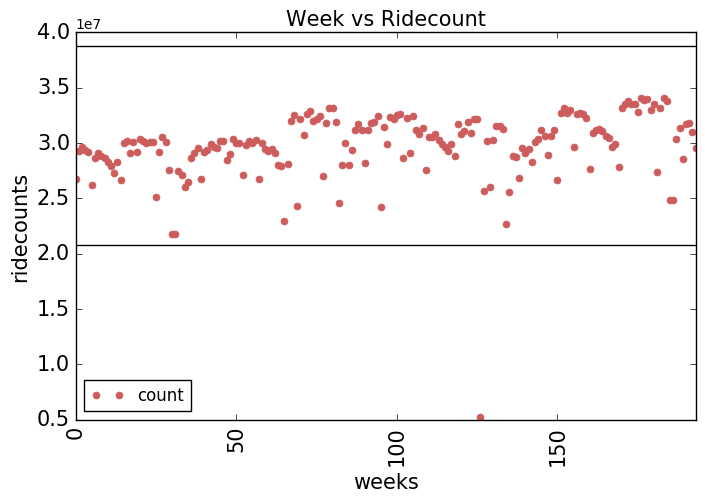

In [85]:
#https://github.com/fedhere/UInotebooks/blob/master/timeseries/FDNYdeaths.ipynb
ax = df1.plot(figsize=(8,5), style=".", ms=10, color="IndianRed")

ax.plot([ax.get_xlim()[0], ax.get_xlim()[1]],[thresholds[0], thresholds[0]], color='k')
ax.plot([ax.get_xlim()[0], ax.get_xlim()[1]],[thresholds[1], thresholds[1]], color='k')
plt.xticks(rotation=90, fontsize=15)
plt.yticks(fontsize=15)

plt.ylabel('ridecounts',fontsize=15)
plt.xlabel('weeks',fontsize=15)
plt.title('Week vs Ridecount',fontsize=15)

print ("mean counts by week {:.2f}".format(df1['count'].mean()))
print ("stdev counts by week {:.2f}".format(df1['count'].std()))
thresholds = [df1['count'].mean() + 3 * df1['count'].std(), 
              df1['count'].mean() - 3 * df1['count'].std()]
print ("3-sigma thresholds {:.2f} {:.2f}".format(*thresholds))

## Event detection:

In [104]:
#find the week with least ridecount
df1['count'].argmin()

126

In [105]:
df1.ix[df1['count'].idxmin()]

count    5.21869e+06
week      2012-10-28
Name: 126, dtype: object

## In week 126, namely 'week : 2012-10-28' there was an unusual event that making the ridecount (521869) far below the threshold.

In [106]:
min(df1['count'])

5218686.0

## Hurricane Sandy shuts down transportation, nearly every bridge, tunnel and major roadway closed in NYC

In [83]:
from IPython.core.display import Image, display

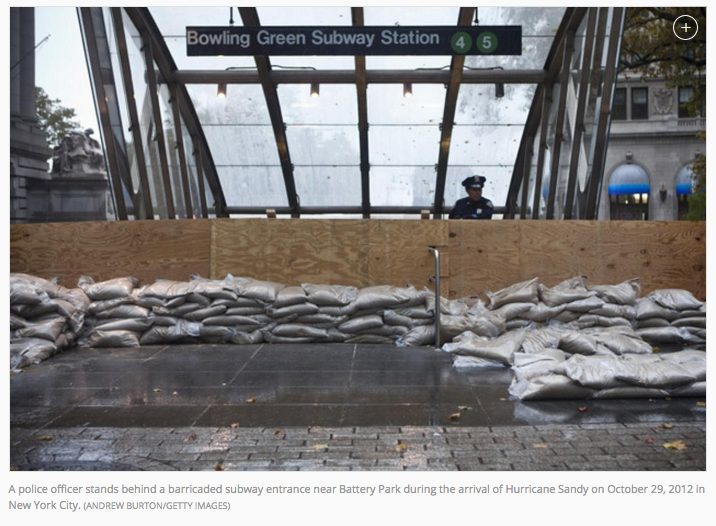

In [84]:
display(Image('Screen Shot 2016-11-07 at 12.16.31 PM.png', width=900, unconfined=True))

### Check links to see more about Hurrican Sandy http://www.nydailynews.com/new-york/holland-battery-tunnels-close-2-p-m-article-1.1194698

# 2


### Some of the time series are stationary, some have a complex structure, some show a downward trend: Identify the ridership types that have steadily increased in popularity, and that have steadily decreased. by how much? (e.g what is the ratio of usage in the first 10 and last 10 weeks)

In [115]:
#sum_week is the usage sum of all 23 ridetype in 600 stations over 194 weeks
sum_week = np.nansum(df, axis=0)
sum_week

array([[  1.14946150e+07,   1.25268590e+07,   1.27666270e+07, ...,
          1.31896100e+07,   1.25007560e+07,   1.24599470e+07],
       [  5.30524000e+05,   5.83533000e+05,   5.86194000e+05, ...,
          6.95134000e+05,   6.70228000e+05,   6.79497000e+05],
       [  4.78010000e+04,   5.14860000e+04,   5.16360000e+04, ...,
          5.87710000e+04,   5.65250000e+04,   5.51920000e+04],
       ..., 
       [  6.12800000e+03,   6.12000000e+03,   6.49000000e+03, ...,
          5.39800000e+03,   5.75900000e+03,   6.18400000e+03],
       [  3.58000000e+02,   4.74000000e+02,   4.65000000e+02, ...,
          8.62000000e+02,   8.10000000e+02,   8.20000000e+02],
       [  0.00000000e+00,   0.00000000e+00,   0.00000000e+00, ...,
          1.13272300e+06,   1.37940300e+06,   5.35018000e+05]])

In [116]:
sum_week.shape

(23, 194)

In [117]:
mean_week = np.nanmean(df, axis=0)
mean_week

/Users/YueCai/anaconda/lib/python2.7/site-packages/numpy/lib/nanfunctions.py:703: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


array([[  2.48801190e+04,   2.71732299e+04,   2.75737084e+04, ...,
          2.85489394e+04,   2.69994730e+04,   2.69695823e+04],
       [  1.14832035e+03,   1.26579826e+03,   1.26607775e+03, ...,
          1.50461905e+03,   1.44757667e+03,   1.47077273e+03],
       [  1.03465368e+02,   1.11683297e+02,   1.11524838e+02, ...,
          1.27209957e+02,   1.22084233e+02,   1.19463203e+02],
       ..., 
       [  1.32640693e+01,   1.32754881e+01,   1.40172786e+01, ...,
          1.16839827e+01,   1.24384449e+01,   1.33852814e+01],
       [  7.74891775e-01,   1.02819957e+00,   1.00431965e+00, ...,
          1.86580087e+00,   1.74946004e+00,   1.77489177e+00],
       [             nan,              nan,              nan, ...,
          2.45178139e+03,   2.97927214e+03,   1.15804762e+03]])

In [151]:
df2=pd.DataFrame(sum_week).T
df2.head()

,0,1,2,3,4,5,6,7,8,9,...,13,14,15,16,17,18,19,20,21,22
0,11494615.0,530524.0,47801.0,186551.0,46808.0,3697443.0,8551937.0,10063.0,333197.0,512032.0,...,123134.0,790110.0,59809.0,28221.0,0.0,124693.0,21060.0,6128.0,358.0,0.0
1,12526859.0,583533.0,51486.0,199229.0,64353.0,3981808.0,9486394.0,11847.0,282755.0,578023.0,...,151948.0,908068.0,69209.0,32333.0,0.0,121713.0,21670.0,6120.0,474.0,0.0
2,12766627.0,586194.0,51636.0,199668.0,56994.0,4033030.0,9476538.0,12277.0,302028.0,615537.0,...,151538.0,914124.0,69574.0,32618.0,0.0,122181.0,21433.0,6490.0,465.0,0.0
3,12653675.0,562602.0,52063.0,196389.0,37429.0,4032753.0,9450081.0,11221.0,305513.0,606270.0,...,147094.0,902549.0,68099.0,32404.0,0.0,122051.0,21630.0,6590.0,484.0,0.0
4,12809694.0,548858.0,51153.0,194883.0,35210.0,3925446.0,9294002.0,10515.0,335780.0,563446.0,...,137888.0,855573.0,66377.0,31933.0,176.0,119776.0,20297.0,6313.0,452.0,0.0


In [119]:
df2.columns=['10t', '14d', '1d', '2t', '30d', '7d', 'ada', 'afas', 'exp','ez',
            'ff','mc','mr','month','rfm','rr','sen','spec','tcmc','t',
            'umlim','xbus','stud']
df2.head()

,10t,14d,1d,2t,30d,7d,ada,afas,exp,ez,...,month,rfm,rr,sen,spec,tcmc,t,umlim,xbus,stud
0,11494615.0,530524.0,47801.0,186551.0,46808.0,3697443.0,8551937.0,10063.0,333197.0,512032.0,...,123134.0,790110.0,59809.0,28221.0,0.0,124693.0,21060.0,6128.0,358.0,0.0
1,12526859.0,583533.0,51486.0,199229.0,64353.0,3981808.0,9486394.0,11847.0,282755.0,578023.0,...,151948.0,908068.0,69209.0,32333.0,0.0,121713.0,21670.0,6120.0,474.0,0.0
2,12766627.0,586194.0,51636.0,199668.0,56994.0,4033030.0,9476538.0,12277.0,302028.0,615537.0,...,151538.0,914124.0,69574.0,32618.0,0.0,122181.0,21433.0,6490.0,465.0,0.0
3,12653675.0,562602.0,52063.0,196389.0,37429.0,4032753.0,9450081.0,11221.0,305513.0,606270.0,...,147094.0,902549.0,68099.0,32404.0,0.0,122051.0,21630.0,6590.0,484.0,0.0
4,12809694.0,548858.0,51153.0,194883.0,35210.0,3925446.0,9294002.0,10515.0,335780.0,563446.0,...,137888.0,855573.0,66377.0,31933.0,176.0,119776.0,20297.0,6313.0,452.0,0.0


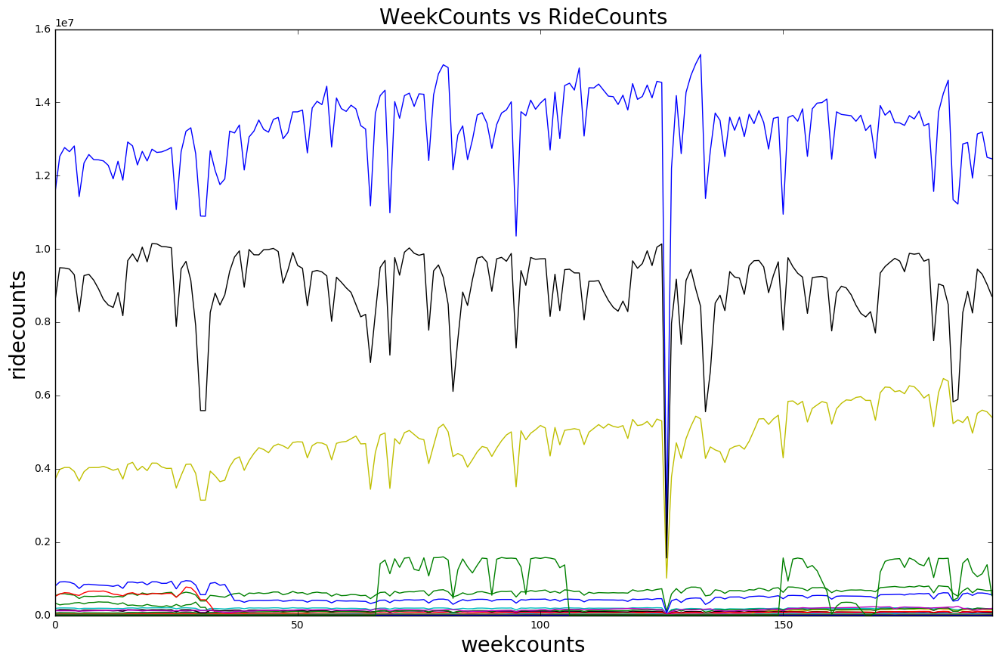

In [179]:
df2.plot(figsize=(16,10), legend=None)
plt.xlabel('weekcounts',fontsize=20 )
plt.ylabel('ridecounts',fontsize=20)
plt.title('WeekCounts vs RideCounts',fontsize=20)

### To evaluate the ridertype tendency, we can compare the ratio of usage in the first 10 and last 10 week (for each ridetype, if the ratio is greater than 1, probably there is an incresed tendency in that ridetype usage, if smaller than 1, it might indicate a decrease in the usage, if the ratio is close to 1, the usage is likely to stay the same.

In [29]:
#http://stackoverflow.com/questions/9039961/finding-the-average-of-a-list
np.mean(df2[-10:])/np.mean(df2[:10])

10t      1.021798e+00
14d      1.252065e+00
1d       1.111345e+00
2t       9.338034e-01
30d      1.033787e+00
7d       1.389748e+00
ada      8.998413e-01
afas     2.094470e-04
exp      1.068703e-05
ez       1.501956e-06
ff       8.188021e-01
mc       1.213541e+00
mr       2.478493e+04
month    5.787224e-01
rfm      6.496084e-01
rr       2.592960e+00
sen      2.909397e+00
spec     7.018238e+01
tcmc     1.532271e+00
t        1.021589e+00
umlim    8.090639e-01
xbus     1.662327e+00
stud              inf
dtype: float64

## To determine whether or not there is a steady tendency (increased/decreased) in each ridetype, methods of polling_mean() and predict line would be applied to find out the results.

### Within which range a tendency is considered 'steadily' increased and decreased? (looking at the residuals...the smaller the sum of residuals, the more steady tendency it might be)

In [107]:
### Typically Steadily increased ridetypes are '14d', 'rr', 'sen', '7d'...

/Users/YueCai/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:2: FutureWarning: pd.rolling_mean is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=10,center=False).mean()
  from ipykernel import kernelapp as app


The ratio of usage is 1.252


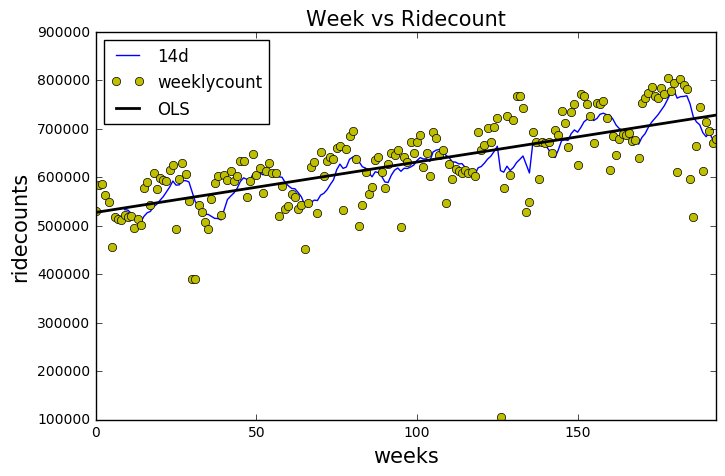

In [31]:
# the polling_mean
ax = pd.rolling_mean(df2['14d'],10).plot(figsize=(8,5))

# the predict lines
Y = df2['14d']
X = range(194)

fit = np.polyfit(X,Y,1)
fit_fn = np.poly1d(fit) 

plt.plot(X,Y,'yo',label="weeklycount")
plt.plot(X, fit_fn(X), 'k',label="OLS", linewidth = 2 )
plt.ylabel('ridecounts',fontsize=15)
plt.xlabel('weeks',fontsize=15)
plt.title('Week vs Ridecount',fontsize=15)

plt.legend(loc='best')
print ("The ratio of usage is {:.3f}".format (np.mean(df2['14d'][-10:])/np.mean(df2['14d'][:10])))

/Users/YueCai/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:2: FutureWarning: pd.rolling_mean is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=10,center=False).mean()
  from ipykernel import kernelapp as app


The ratio of usage is 1.390


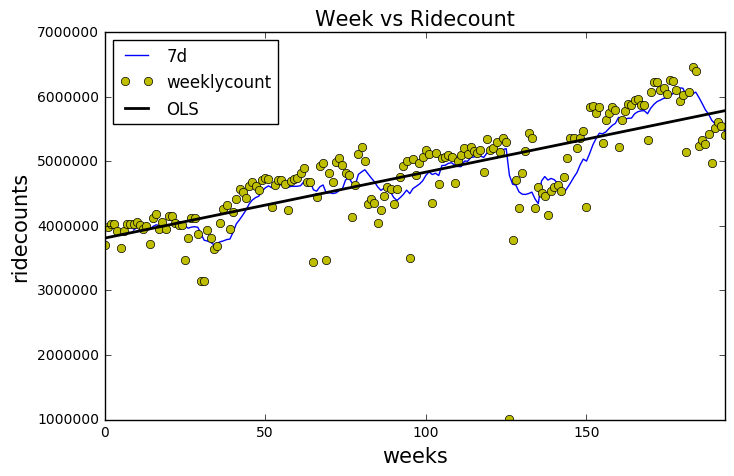

In [35]:
# the polling_mean
ax = pd.rolling_mean(df2['7d'],10).plot(figsize=(8,5))

# the predict lines
Y = df2['7d']
X = range(194)

fit = np.polyfit(X,Y,1)
fit_fn = np.poly1d(fit) 

plt.plot(X,Y,'yo',label="weeklycount")
plt.plot(X, fit_fn(X), 'k',label="OLS", linewidth = 2 )
plt.ylabel('ridecounts',fontsize=15)
plt.xlabel('weeks',fontsize=15)
plt.title('Week vs Ridecount',fontsize=15)

plt.legend(loc='best')
print ("The ratio of usage is {:.3f}".format (np.mean(df2['7d'][-10:])/np.mean(df2['7d'][:10])))

/Users/YueCai/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:2: FutureWarning: pd.rolling_mean is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=10,center=False).mean()
  from ipykernel import kernelapp as app


The ratio of usage is 2.593


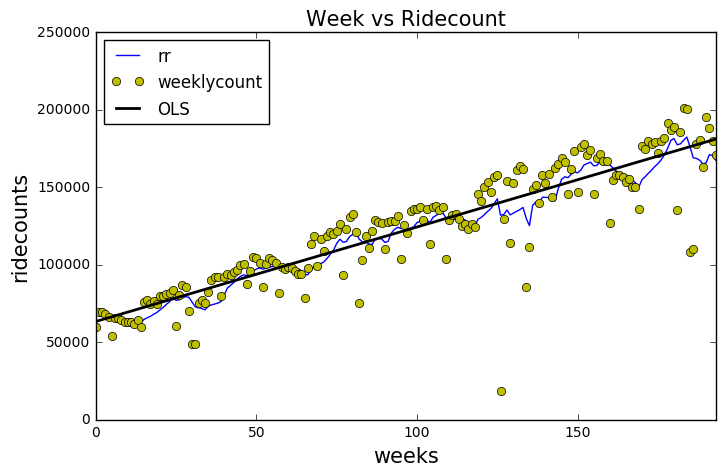

In [120]:
# the polling_mean
ax = pd.rolling_mean(df2['rr'],10).plot(figsize=(8,5))

# the predict lines
Y = df2['rr']
X = range(194)

fit = np.polyfit(X,Y,1)
fit_fn = np.poly1d(fit) 

plt.plot(X,Y,'yo',label="weeklycount")
plt.plot(X, fit_fn(X), 'k',label="OLS", linewidth = 2 )
plt.ylabel('ridecounts',fontsize=15)
plt.xlabel('weeks',fontsize=15)
plt.title('Week vs Ridecount',fontsize=15)

plt.legend(loc='best')
print ("The ratio of usage is {:.3f}".format (np.mean(df2['rr'][-10:])/np.mean(df2['rr'][:10])))

/Users/YueCai/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:2: FutureWarning: pd.rolling_mean is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=10,center=False).mean()
  from ipykernel import kernelapp as app


The ratio of usage is 2.909


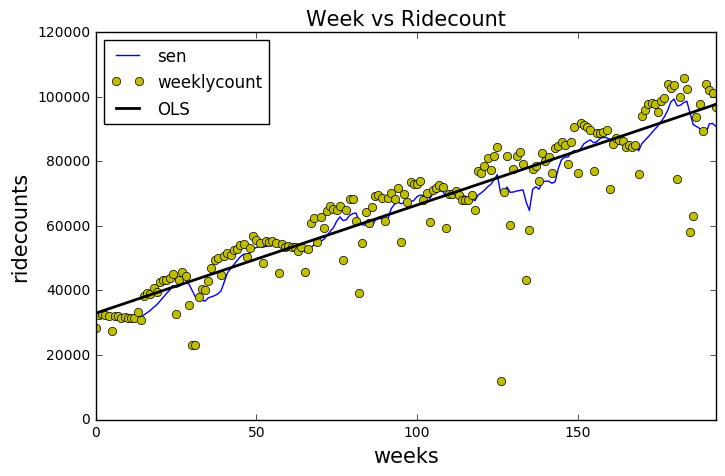

In [121]:
# the polling_mean
ax = pd.rolling_mean(df2['sen'],10).plot(figsize=(8,5))

# the predict lines
Y = df2['sen']
X = range(194)

fit = np.polyfit(X,Y,1)
fit_fn = np.poly1d(fit) 

plt.plot(X,Y,'yo',label="weeklycount")
plt.plot(X, fit_fn(X), 'k',label="OLS", linewidth = 2 )
plt.ylabel('ridecounts',fontsize=15)
plt.xlabel('weeks',fontsize=15)
plt.title('Week vs Ridecount',fontsize=15)

plt.legend(loc='best')
print ("The ratio of usage is {:.3f}".format (np.mean(df2['sen'][-10:])/np.mean(df2['sen'][:10])))

In [111]:
### Typically Steadily decreased ridetypes are '2t','ada', 'month' ...

/Users/YueCai/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:2: FutureWarning: pd.rolling_mean is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=10,center=False).mean()
  from ipykernel import kernelapp as app


The ratio of usage is 0.900


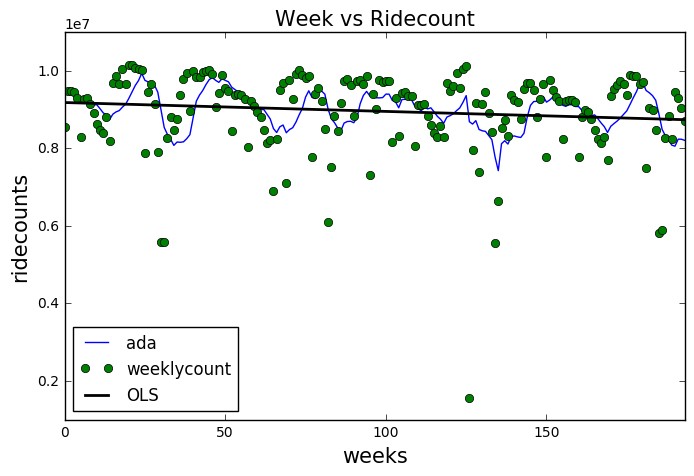

In [36]:
# the polling_mean
ax = pd.rolling_mean(df2['ada'],10).plot(figsize=(8,5))

# the predict lines
Y = df2['ada']
X = range(194)

fit = np.polyfit(X,Y,1)
fit_fn = np.poly1d(fit) 

plt.plot(X,Y,'go',label="weeklycount")
plt.plot(X, fit_fn(X), 'k',label="OLS", linewidth = 2 )
plt.ylabel('ridecounts',fontsize=15)
plt.xlabel('weeks',fontsize=15)
plt.title('Week vs Ridecount',fontsize=15)

plt.legend(loc='best')
print ("The ratio of usage is {:.3f}".format (np.mean(df2['ada'][-10:])/np.mean(df2['ada'][:10])))

/Users/YueCai/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:2: FutureWarning: pd.rolling_mean is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=10,center=False).mean()
  from ipykernel import kernelapp as app


The ratio of usage is 0.579


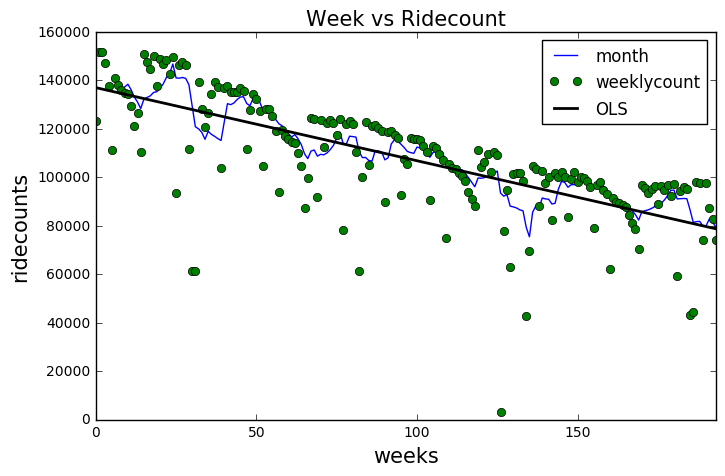

In [42]:
# the polling_mean
ax = pd.rolling_mean(df2['month'],10).plot(figsize=(8,5))

# the predict lines
Y = df2['month']
X = range(194)

fit = np.polyfit(X,Y,1)
fit_fn = np.poly1d(fit) 

plt.plot(X,Y,'go',label="weeklycount")
plt.plot(X, fit_fn(X), 'k',label="OLS", linewidth = 2 )
plt.ylabel('ridecounts',fontsize=15)
plt.xlabel('weeks',fontsize=15)
plt.title('Week vs Ridecount',fontsize=15)

plt.legend(loc='best')
print ("The ratio of usage is {:.3f}".format (np.mean(df2['month'][-10:])/np.mean(df2['month'][:10])))

In [113]:
### Others are increaed but not in a smoothy manner, such as ridetype 'spec', 'xbus'....

/Users/YueCai/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:2: FutureWarning: pd.rolling_mean is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=10,center=False).mean()
  from ipykernel import kernelapp as app


The ratio of usage is 70.182


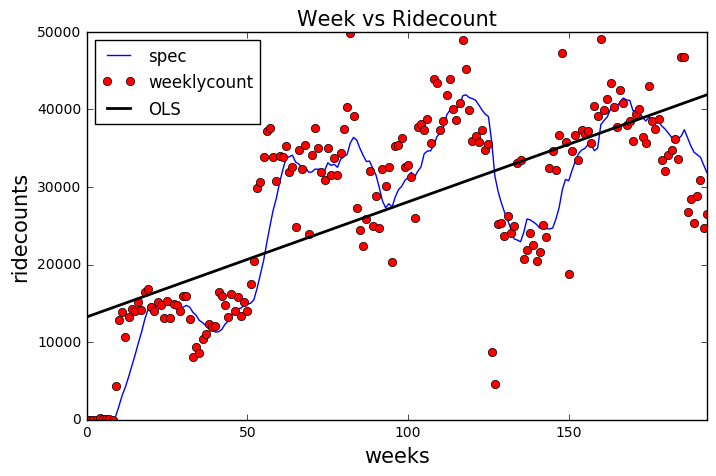

In [126]:
# the polling_mean
ax = pd.rolling_mean(df2['spec'],10).plot(figsize=(8,5))

# the predict lines
Y = df2['spec']
X = range(194)

fit = np.polyfit(X,Y,1)
fit_fn = np.poly1d(fit) 

plt.plot(X,Y,'ro',label="weeklycount")
plt.plot(X, fit_fn(X), 'k',label="OLS", linewidth = 2 )
plt.ylabel('ridecounts',fontsize=15)
plt.xlabel('weeks',fontsize=15)
plt.title('Week vs Ridecount',fontsize=15)

plt.legend(loc='best')
print ("The ratio of usage is {:.3f}".format (np.mean(df2['spec'][-10:])/np.mean(df2['spec'][:10])))

# 3

### Several stations show a prominent annual periodicity. Identify the 4 stations (indentify them by the index of their location in the data cube) that show the most prominent periodic trend on an annual period (52 weeks). (Can you figure out what the periodic peak in rides is due to?)

In [149]:
df.shape

(600, 23, 194)

In [8]:
sum_ridetype = np.nansum(df, axis=1)
sum_ridetype

array([[ 126878.,  149477.,  152383., ...,   78901.,   74591.,   76833.],
       [  37306.,   46464.,   49359., ...,       0.,       0.,       0.],
       [   6606.,    6881.,    7229., ...,    8171.,    7907.,    6790.],
       ..., 
       [      0.,       0.,       0., ...,       0.,       0.,       0.],
       [      0.,       0.,       0., ...,       0.,       0.,       0.],
       [      0.,       0.,       0., ...,       0.,       0.,       0.]])

In [9]:
sum_ridetype.shape

(600, 194)

In [10]:
df3=pd.DataFrame(sum_ridetype).T
df3.head()

,0,1,2,3,4,5,6,7,8,9,...,590,591,592,593,594,595,596,597,598,599
0,126878.0,37306.0,6606.0,16378.0,18564.0,19987.0,12449.0,11091.0,10482.0,147187.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,149477.0,46464.0,6881.0,17408.0,19903.0,20625.0,13644.0,11659.0,11030.0,154826.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,152383.0,49359.0,7229.0,17595.0,19948.0,21225.0,13719.0,12037.0,10881.0,155958.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,160175.0,44849.0,5731.0,14242.0,16076.0,17412.0,11460.0,9809.0,9123.0,154914.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,162641.0,41509.0,7032.0,17589.0,20283.0,20909.0,14094.0,11944.0,10923.0,157628.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### row : week (total usage of all ridetype in 194 weeks)
### cloumn : station 

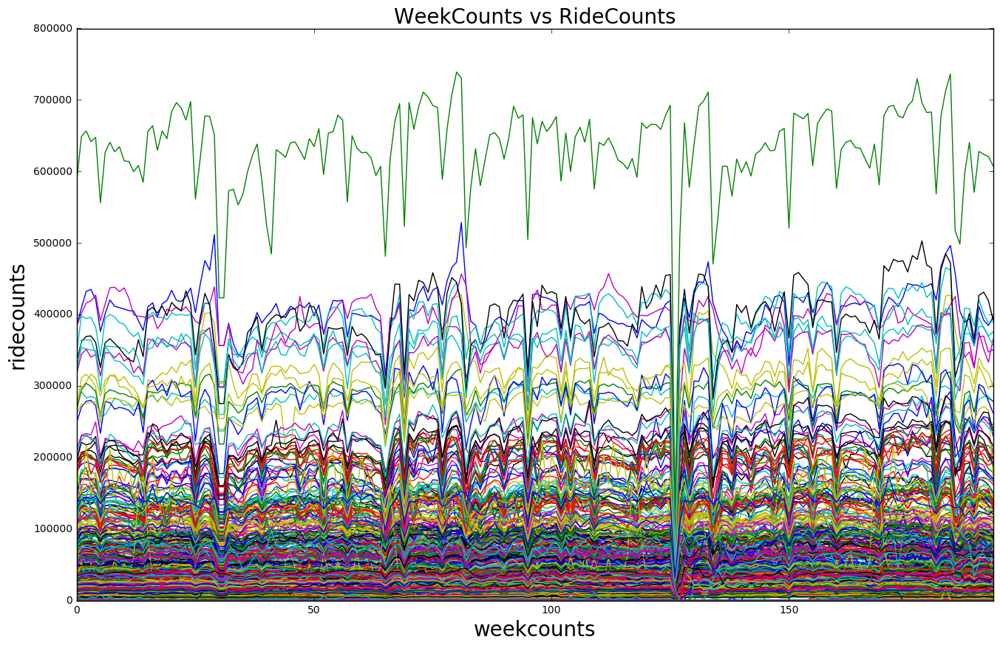

In [298]:
df3.plot(figsize=(16,10),legend=None)
plt.xlabel('weekcounts',fontsize=20)
plt.ylabel('ridecounts',fontsize=20)
plt.title('WeekCounts vs RideCounts',fontsize=20)

/Users/YueCai/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:8: RuntimeWarning: divide by zero encountered in double_scalars


<function matplotlib.pyplot.legend>

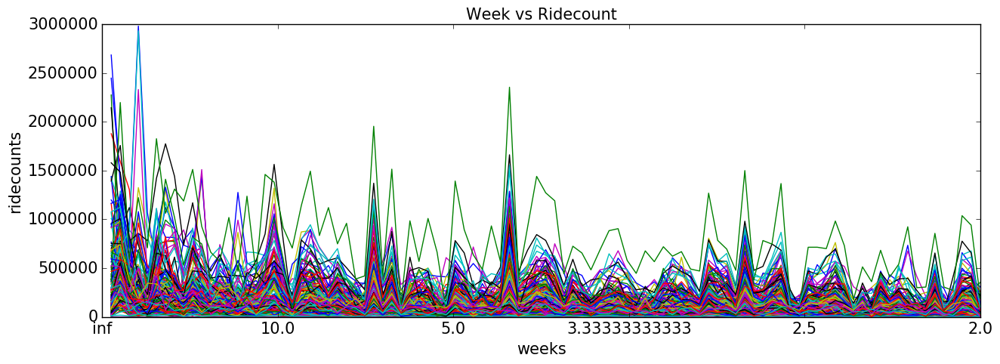

In [282]:
fig=plt.figure(figsize=(15,5))
ax=fig.add_subplot(111)
f = np.abs(np.fft.rfft(df3.iloc[:,0]))
for i in range(194):
    f = np.abs(np.fft.rfft(df3.iloc[:,i]))
    plt.plot(np.fft.rfftfreq(194, 1.0)[1:], (f[1:]), '-')
#ax.set_xlim(0,1.0/20)
ax.set_xticklabels([ "%s"%(1/f) for f in ax.get_xticks()], fontsize=20)

plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.ylabel('ridecounts',fontsize=15)
plt.xlabel('weeks',fontsize=15)
plt.title('Week vs Ridecount',fontsize=15)
plt.legend

plt.figure(figsize=(20,50))
for i in range(600):
    plt.subplot(60,10,i+1)
    f = np.abs(np.fft.rfft(df3.iloc[:,i]))
    plt.plot(np.fft.rfftfreq(194, 1.0)[1:], (f[1:]), '-')
    ax.set_xticklabels([ "%s"%(1/f) for f in ax.get_xticks()], fontsize=20)

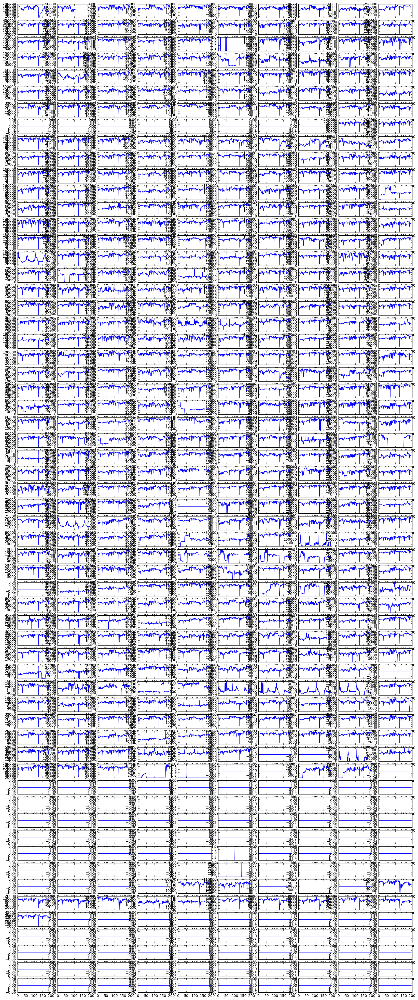

In [331]:
# plot all possible tendency, including the vaule missing ones 
plt.figure(figsize=(20,50))
for i in range(600):
    plt.subplot(60,10,i+1)
    Y = df3.iloc[:,i]
    X = range(194)
    plt.plot(X,Y)    

### Finally, I figure out there are five ridetypes seemed have the annual period (about 52 weeks)

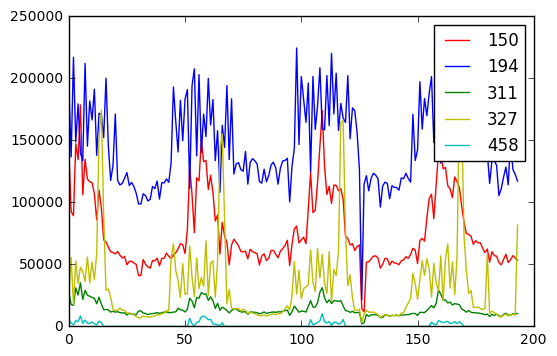

In [148]:
plt.plot(range(194), df3.iloc[:,150], 'r-', label='150')
plt.plot(range(194), df3.iloc[:,194], 'b-', label='194')
plt.plot(range(194), df3.iloc[:,311], 'g-', label='311')
plt.plot(range(194), df3.iloc[:,327], 'y-', label='327')
plt.plot(range(194), df3.iloc[:,458], 'c-', label='458')
plt.legend()
plt.show()

In [160]:
# I fail to figure out why there are the peaks...

# EXTRA CREDIT: Cluster.
### Cluster the time series, i.e. identify groups of time series that look similar among each other. You can use KMeans for example to identify common trends, or PCA (Principle Component Analysis).


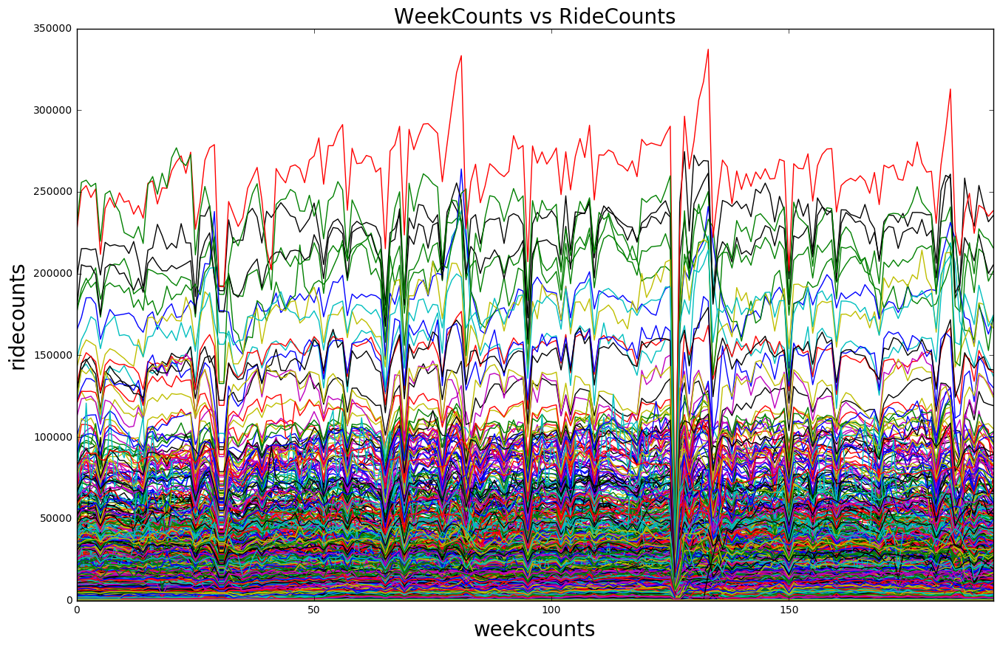

In [154]:
# 600*23 time series for all stations and all ridetypes
import matplotlib.pylab as plt
%matplotlib inline
(df0.T).plot(figsize=(16,10),legend=None)
plt.xlabel('weekcounts',fontsize=20)
plt.ylabel('ridecounts',fontsize=20)
plt.title('WeekCounts vs RideCounts',fontsize=20)

## Standardization

In [158]:
# standardize each time series
df4=(df0-df0.min())/(df0.max()-df0.min())
df4.head()

,0,1,2,3,4,5,6,7,8,9,...,184,185,186,187,188,189,190,191,192,193
0,0.248621,0.252954,0.264448,0.286783,0.297250,0.329635,0.286301,0.285335,0.304251,0.290747,...,0.139362,0.198240,0.222448,0.151101,0.150091,0.147887,0.151059,0.151210,0.144354,0.154461
1,0.007560,0.008143,0.008194,0.008640,0.009066,0.008742,0.008333,0.007978,0.008373,0.007939,...,0.004554,0.004804,0.004572,0.004968,0.005649,0.004738,0.005470,0.005233,0.004986,0.005193
2,0.000886,0.001079,0.000953,0.001106,0.001038,0.001097,0.001118,0.000942,0.001064,0.001058,...,0.000693,0.000837,0.000711,0.000751,0.000735,0.000808,0.000788,0.000770,0.000711,0.000700
3,0.003854,0.003745,0.003795,0.003897,0.003965,0.004219,0.003612,0.003600,0.003739,0.003636,...,0.001841,0.002037,0.001838,0.002000,0.002381,0.002175,0.002119,0.002256,0.002195,0.002051
4,0.001563,0.002068,0.001641,0.001031,0.000972,0.001647,0.001926,0.001377,0.000792,0.001660,...,0.000927,0.000483,0.000587,0.001350,0.001433,0.000860,0.000866,0.001163,0.001315,0.001028


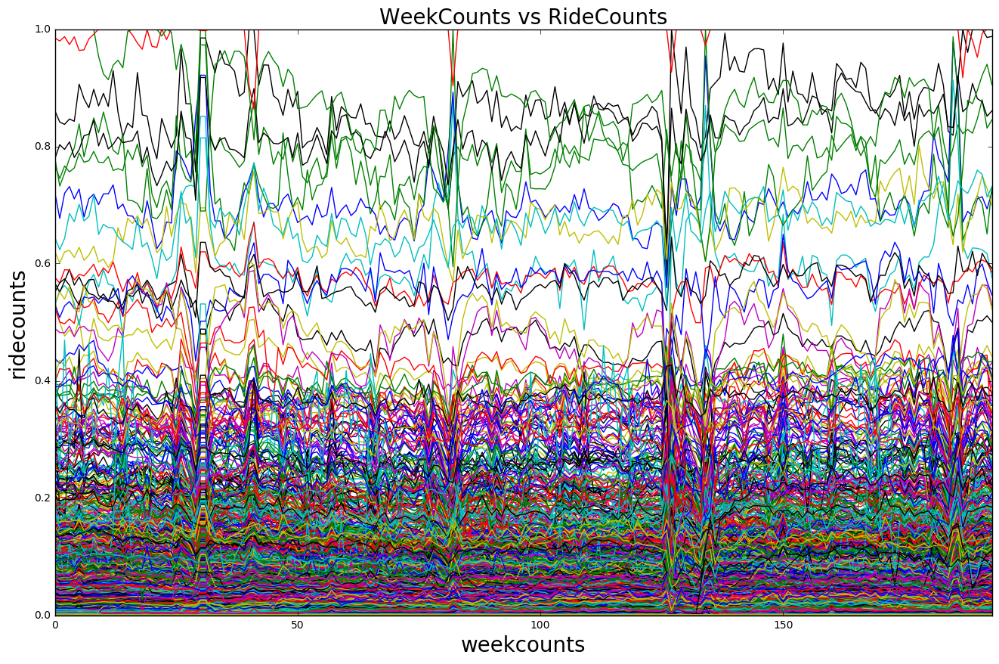

In [159]:
# new plot
(df4.T).plot(figsize=(16,10),legend=None)
plt.xlabel('weekcounts',fontsize=20)
plt.ylabel('ridecounts',fontsize=20)
plt.title('WeekCounts vs RideCounts',fontsize=20)

## Sort Data

In [163]:
# remove Nan in columns
df5=df4.dropna(axis=1,how='all')
df5.head()

,0,1,2,3,4,5,6,7,8,9,...,184,185,186,187,188,189,190,191,192,193
0,0.248621,0.252954,0.264448,0.286783,0.297250,0.329635,0.286301,0.285335,0.304251,0.290747,...,0.139362,0.198240,0.222448,0.151101,0.150091,0.147887,0.151059,0.151210,0.144354,0.154461
1,0.007560,0.008143,0.008194,0.008640,0.009066,0.008742,0.008333,0.007978,0.008373,0.007939,...,0.004554,0.004804,0.004572,0.004968,0.005649,0.004738,0.005470,0.005233,0.004986,0.005193
2,0.000886,0.001079,0.000953,0.001106,0.001038,0.001097,0.001118,0.000942,0.001064,0.001058,...,0.000693,0.000837,0.000711,0.000751,0.000735,0.000808,0.000788,0.000770,0.000711,0.000700
3,0.003854,0.003745,0.003795,0.003897,0.003965,0.004219,0.003612,0.003600,0.003739,0.003636,...,0.001841,0.002037,0.001838,0.002000,0.002381,0.002175,0.002119,0.002256,0.002195,0.002051
4,0.001563,0.002068,0.001641,0.001031,0.000972,0.001647,0.001926,0.001377,0.000792,0.001660,...,0.000927,0.000483,0.000587,0.001350,0.001433,0.000860,0.000866,0.001163,0.001315,0.001028


In [166]:
# remove Nan in rows
df6 =df5.dropna(axis=0,how='any')
df6.head()

,0,1,2,3,4,5,6,7,8,9,...,184,185,186,187,188,189,190,191,192,193
46,0.014369,0.013406,0.014113,0.011088,0.014160,0.011837,0.011454,0.011166,0.011906,0.014398,...,0.011204,0.012813,0.012692,0.012912,0.014449,0.014294,0.013461,0.015507,0.014491,0.013494
47,0.000480,0.000360,0.000397,0.000312,0.000364,0.000337,0.000290,0.000367,0.000400,0.000381,...,0.000614,0.000739,0.000758,0.000696,0.000819,0.000725,0.000752,0.000878,0.000889,0.000885
48,0.000031,0.000023,0.000051,0.000028,0.000020,0.000032,0.000028,0.000024,0.000012,0.000016,...,0.000067,0.000075,0.000085,0.000077,0.000076,0.000057,0.000075,0.000108,0.000085,0.000092
49,0.000179,0.000199,0.000183,0.000146,0.000196,0.000196,0.000177,0.000128,0.000177,0.000229,...,0.000080,0.000080,0.000114,0.000077,0.000100,0.000127,0.000122,0.000116,0.000102,0.000092
50,0.000000,0.000000,0.000000,0.000000,0.000004,0.000005,0.000000,0.000000,0.000000,0.000008,...,0.000006,0.000004,0.000005,0.000039,0.000032,0.000026,0.000020,0.000021,0.000026,0.000000


## Use a distance function

In [169]:
#http://stackoverflow.com/questions/20303323/distance-calculation-between-rows-in-pandas-dataframe-using-a-distance-matrix
from scipy.spatial.distance import pdist, squareform
distances = pdist(df6, metric='euclidean')
DistMatrix = squareform(distances)
DistMatrix

array([[ 0.        ,  0.18280418,  0.18956693, ...,  0.19051897,
         0.19051897,  0.19051897],
       [ 0.18280418,  0.        ,  0.00707741, ...,  0.00805621,
         0.00805621,  0.00805621],
       [ 0.18956693,  0.00707741,  0.        , ...,  0.00104481,
         0.00104481,  0.00104481],
       ..., 
       [ 0.19051897,  0.00805621,  0.00104481, ...,  0.        ,
         0.        ,  0.        ],
       [ 0.19051897,  0.00805621,  0.00104481, ...,  0.        ,
         0.        ,  0.        ],
       [ 0.19051897,  0.00805621,  0.00104481, ...,  0.        ,
         0.        ,  0.        ]])

In [170]:
DistMatrix.shape

(9174, 9174)

## clustering similar time series by their euclidean distance (technically don't know how to do this...)